<a href="https://colab.research.google.com/github/sholmiw/Kohonen-algorithm/blob/master/som2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


 1. Implement the Kohonen algorithm and use it to fit a line of neurons
in a plane (square). What happens when you use few neurons, when
you use many? What happens as the number of iterations of algorithm increases?

Do the same with at least two non-uniform densities on the plane.

2. Do the same experiments as above for fitting a circle of neurons on a
torus (i.e a donut shape.)

Be sure to report on the results of your different attempts. .


imports

In [0]:
import numpy as np
import math
import matplotlib.pyplot as plt
import random 

functions

ecliden distance

In [0]:
def eucliden_distance1(x,y,xr,yr):
    return np.sqrt((x-xr)**2+(y-yr)**2)

bmu

In [0]:

def bmu1(x,y,xr,yr):
    distanes=eucliden_distance1(x,y,xr,yr)
    index_min=np.argmin(distanes).item()
    return index_min

update

In [0]:
  
def update_neightbord1(x,y,min_indx,x_rand,y_rand,alpha,radius):    
    #dis=eucliden_distance1(x,y,x[min_indx],y[min_indx])    
    x[min_indx] = x[min_indx]+alpha*(x_rand-x[min_indx])
    y[min_indx] = y[min_indx]+alpha*(y_rand-y[min_indx])
    for idx in range(radius):            
        if idx+min_indx+1 < x.size -1:
            x[idx+min_indx+1] = x[idx+min_indx+1]+alpha*(x_rand-x[idx+min_indx+1])
            y[idx+min_indx+1] = y[idx+min_indx+1]+alpha*(y_rand-y[idx+min_indx+1])
        if idx+min_indx+1 > 0:
            x[idx-min_indx-1] = x[idx-min_indx-1]+alpha*(x_rand-x[idx-min_indx-1])
            y[idx-min_indx-1] = y[idx-min_indx-1]+alpha*(y_rand-y[idx-min_indx-1])
          
    return(x,y)    
    

      

train 

In [0]:
 
def train1(x,y,steps,alpha,radius,isline=True):
    init_alpha=alpha
    init_radius=radius
    a=[]
    b=[]
    
    for i in range(steps):    
        x_rand=np.random.uniform(-10,10,1)
        y_rand=np.random.uniform(-10,10,1)
        a.append(x_rand) 
        b.append(y_rand)
  
        ind_min=bmu1(x,y,x_rand,y_rand)
      
        x,y=update_neightbord1(x,y,ind_min,x_rand,y_rand,init_alpha,init_radius)
     
        alpha = init_alpha * np.exp(-i/steps)
        #radius  = init_radius * np.exp(-i/steps)
        if i%5000==0 :
          init_radius  = init_radius -1
          radius  = init_radius 
        if i%200==0:
            draw1(x, y, i, radius, alpha,a,b)
        if i == steps-1:
            draw1(x, y, steps, radius, alpha,a,b)
        
        


draw

In [0]:

def draw1(w1, w2, iterate, radius, l_rate, x,y,isline=True):
    
    fig, ax = plt.subplots()

    #w1, w2 = zip(*sorted(zip(w1,w2)))
    if isline:
      plt.plot(w1, w2, color='brown', marker='o', linestyle='dashed', 
                           linewidth=2, markersize=12)
      
    else:
      plt.plot(w1, w2, color='brown', marker='o', linestyle='none', 
                           markersize=12)
    #plt.plot(x,y, color='blue', marker='o', linestyle='dashed', 
    #                       linewidth=2, markersize=12)
    ax.set(xlabel='x', 
           ylabel='y',
           title='Kohonen algorithm (Setps: {}, Radius: {:.3f}, learnibg_rate:{:.3f})'
           .format(iterate, radius, l_rate))
    ax.grid()
    plt.show()   

model number 1:


1.   number of neruns =50
2.   dimater =-100 <= x,y <= 100
3.   epoch =1000
4.   learning rate =0.5



model 1


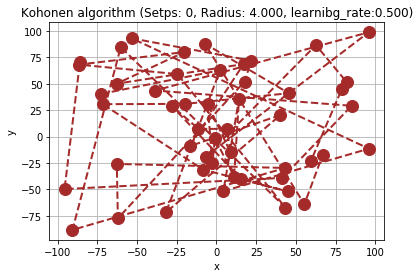

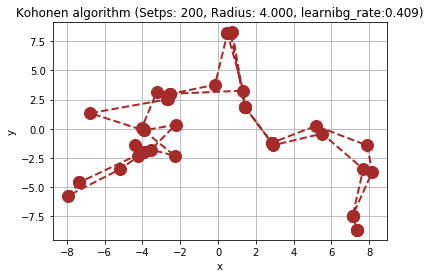

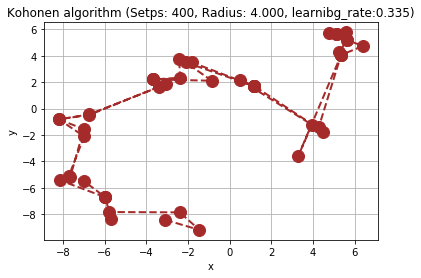

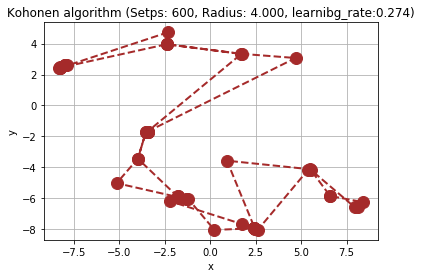

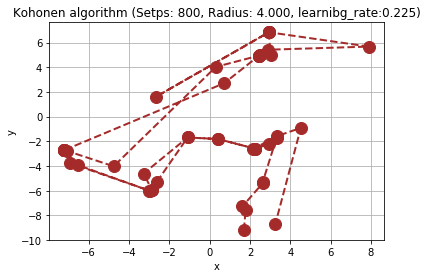

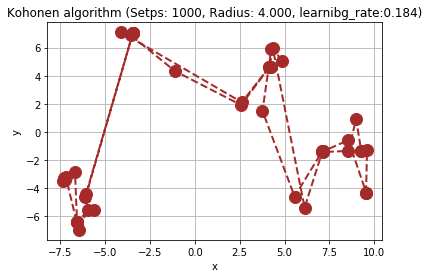

In [0]:
print("model 1")  
x = np.random.uniform(-100,100,50)
y = np.random.uniform(-100,100,50)

step_max =1000
radius = 5
alpha = 0.5

#draw(x, y, 0, radius, alpha)
train1(x, y, step_max, alpha,  radius) 


model number 2:


1.   number of neurons =50
2.   range =-100 <= x,y <= 100
3.   epoch =20300
4.   learning rate =0.5



model 1


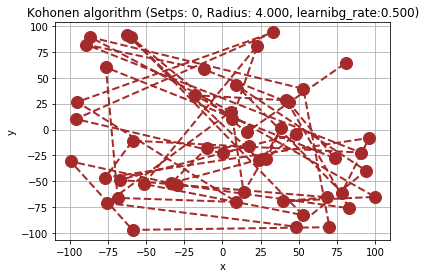

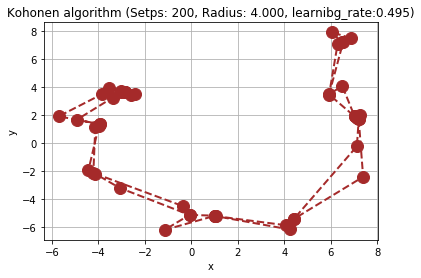

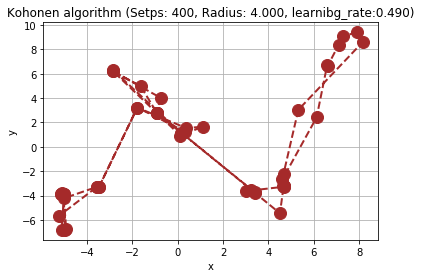

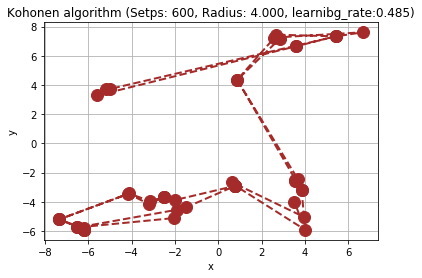

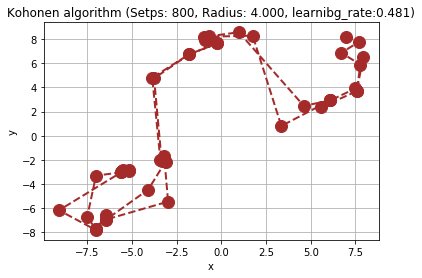

...

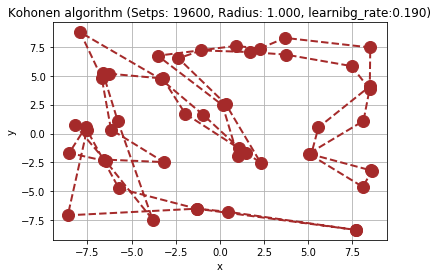

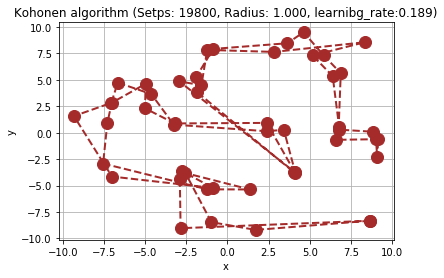

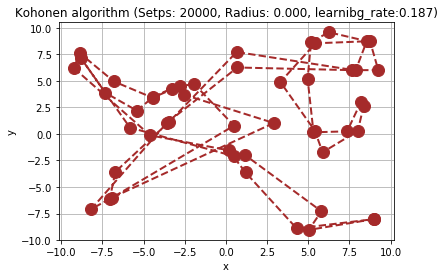

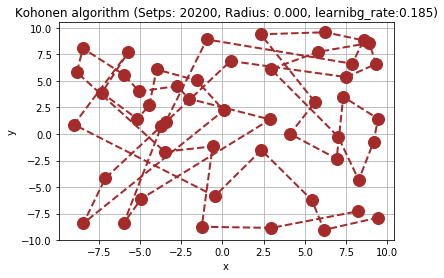

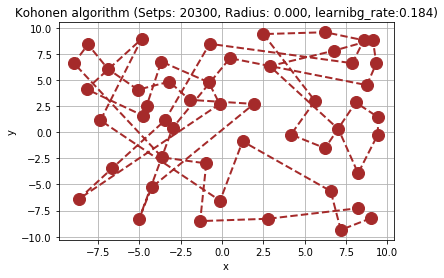

In [0]:
print("model 1")  
x = np.random.uniform(-100,100,50)
y = np.random.uniform(-100,100,50)

step_max =20300
radius = 5
alpha = 0.5

#draw(x, y, 0, radius, alpha)
train1(x, y, step_max, alpha,  radius) 


model number 3: 
 more neruons

1.   number of neurons =50
2.   range =-100 <= x,y <= 100
3.   epoch =20300
4.   learning rate =0.5



model 3


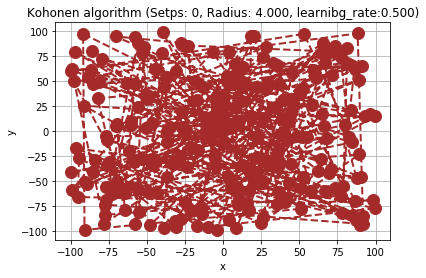

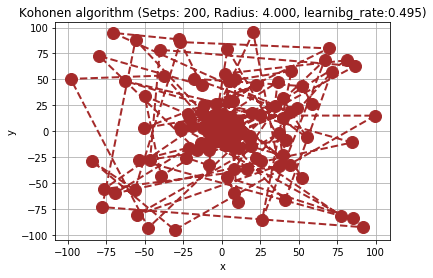

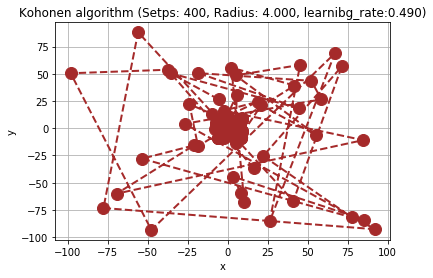

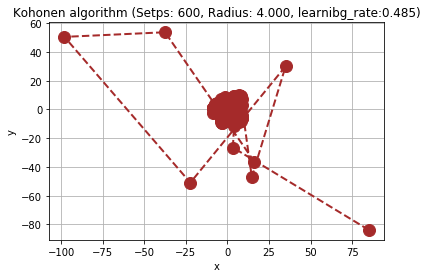

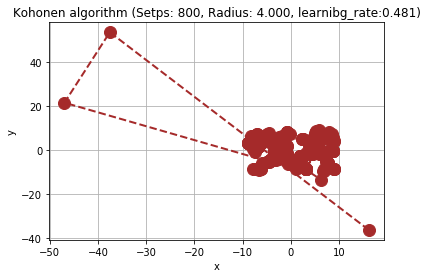

...

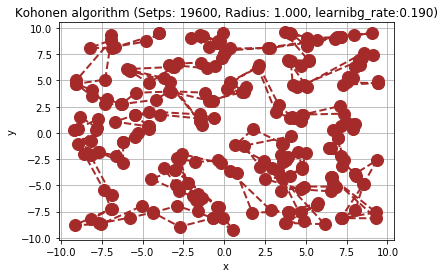

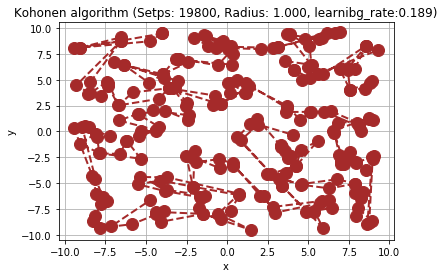

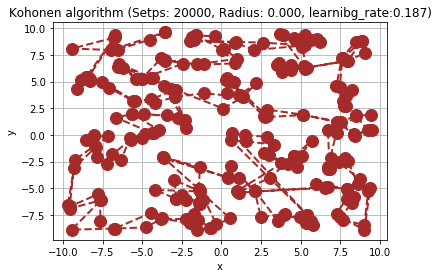

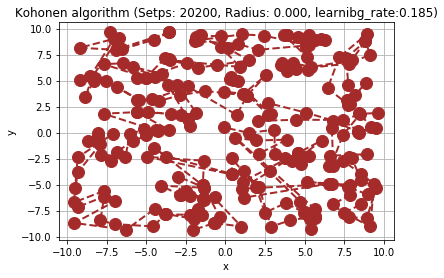

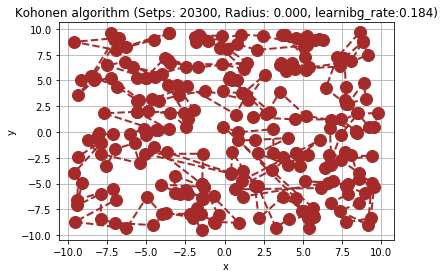

In [0]:
print("model 3")  
x = np.random.uniform(-100,100,250)
y = np.random.uniform(-100,100,250)

step_max =20300
radius = 5
alpha = 0.5

#draw(x, y, 0, radius, alpha)
train1(x, y, step_max, alpha,  radius) 


model number 4:
non uniform




In [0]:
def rand_non_uniform():
  x1 = np.random.uniform(-100,0,15)
  y1 = np.random.uniform(0,100,15)

  x2 = np.random.uniform(-100,0,70)
  y2 = np.random.uniform(-100,0,70)

  x3 = np.random.uniform(0,100,15)
  y3 = np.random.uniform(-100,0,15)

  x4 = np.random.uniform(0,100,15)
  y4 = np.random.uniform(0,100,15)

  x = np.append(x1, x2)
  x = np.append(x, x3)
  x = np.append(x, x4)
  
  y = np.append(y1, y2)
  y = np.append(y, y3)
  y = np.append(y, y4)
  return x, y

def non_uniform (i ,steps):
  if i< steps /8:
    x = np.random.uniform(-100,0,1)
    y = np.random.uniform(-100,0,1)
  else:
    x = np.random.uniform(80,100,1)
    y = np.random.uniform(80,100,1)
    
  return x, y
  

In [0]:
def train2(x,y,steps,alpha,radius,isline=True ,From_range=-100 ,to_range=100):
    init_alpha=alpha
    init_radius=radius
    a=[] 
    b=[]
    if isline:
        for i in range(steps):
            x_rand , y_rand = non_uniform (i ,steps)
            a.append(x_rand) 
            b.append(y_rand)

            ind_min=bmu1(x,y,x_rand,y_rand)

            x,y=update_neightbord1(x,y,ind_min,x_rand,y_rand,init_alpha,init_radius)

            alpha = init_alpha * np.exp(-i/steps)
          #radius  = init_radius * np.exp(-i/steps)
            if i%5000==0 :
                init_radius  = init_radius -1
                radius  = init_radius 
            if i%200==0:
                draw1(x, y, i, radius, alpha,a,b)
            if i == steps-1:
                draw1(x, y, steps, radius, alpha,a,b)
    else:
      
       for i in range(steps):
            x_rand , y_rand = from_circle()
            a.append(x_rand) 
            b.append(y_rand)

            ind_min=bmu1(x,y,x_rand,y_rand)

            x,y=update_neightbord1(x,y,ind_min,x_rand,y_rand,init_alpha,init_radius)

            alpha = init_alpha * np.exp(-i/steps)
          #radius  = init_radius * np.exp(-i/steps)
            if i%5000==0 :
                init_radius  = init_radius -1
                radius  = init_radius 
            if i%200==0:
                draw1(x, y, i, radius, alpha,a,b)
            if i == steps-1:
                draw1(x, y, steps, radius, alpha,a,b)

model 4


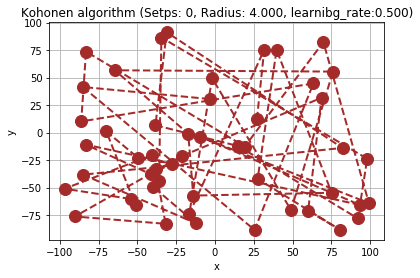

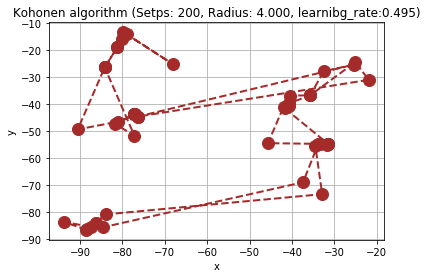

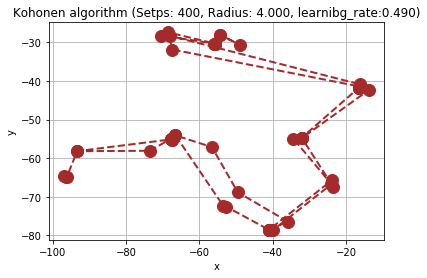

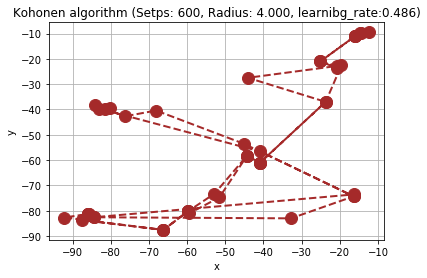

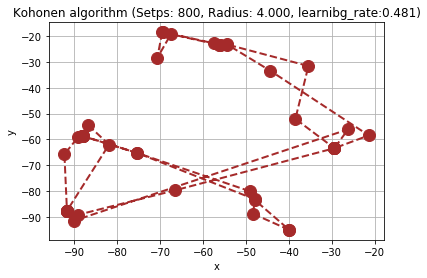

...

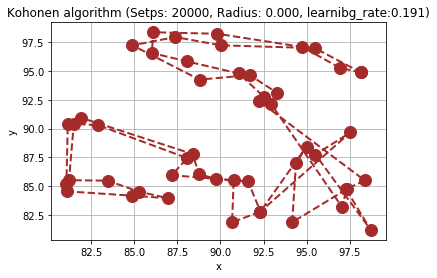

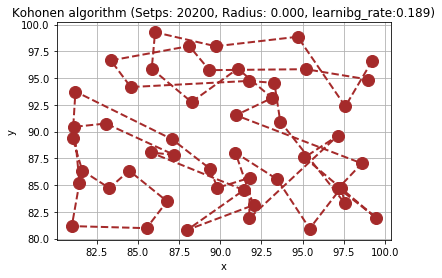

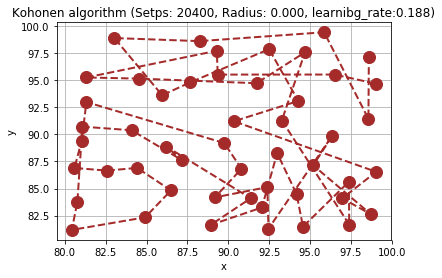

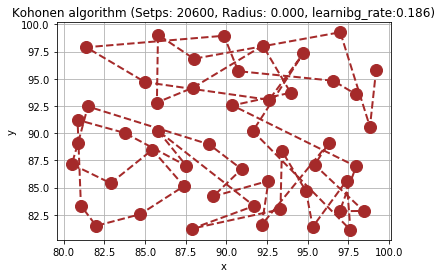

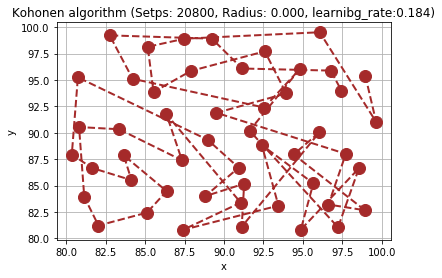

In [0]:
print("model 4")  

x = np.random.uniform(-100,100,50)
y = np.random.uniform(-100,100,50)

step_max =20800
radius = 5
alpha = 0.5

#draw(x, y, 0, radius, alpha)
train2(x, y, step_max, alpha,  radius ) 


we see lot of itratien "cancal" the non-uniform randomness

model 5


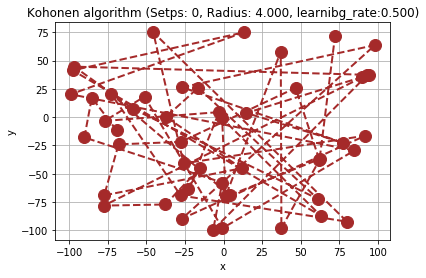

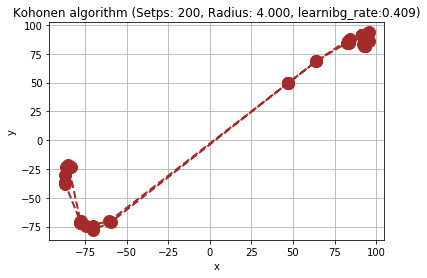

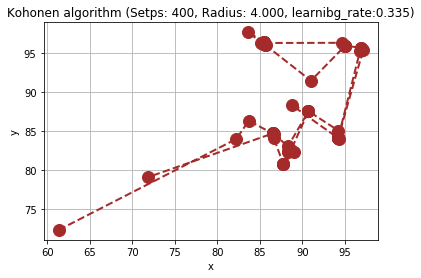

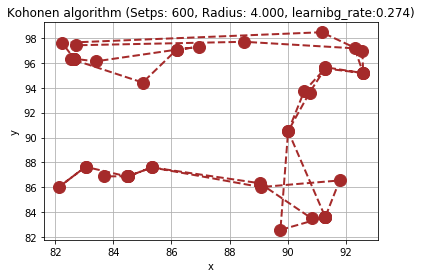

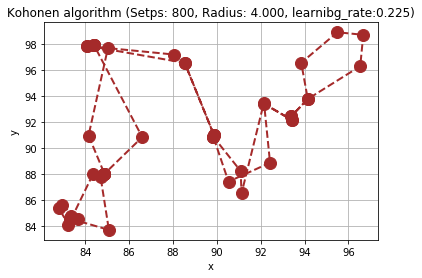

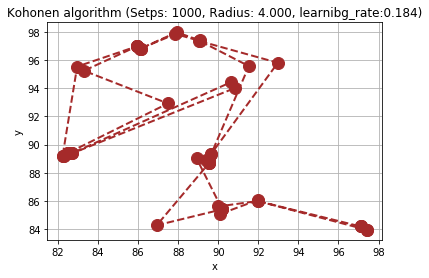

In [0]:
print("model 5")  

x = np.random.uniform(-100,100,50)
y = np.random.uniform(-100,100,50)

step_max =1000
radius = 5
alpha = 0.5

#draw(x, y, 0, radius, alpha)
train2(x, y, step_max, alpha,  radius) 


the non-uniform is 1/8 between -100 to 0 and the rest between 80 to 100 (both x and y)

model 5


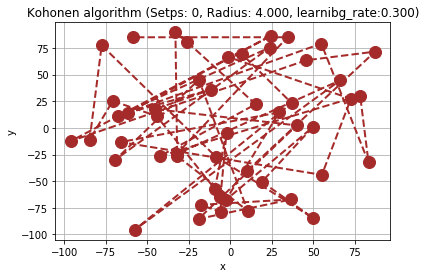

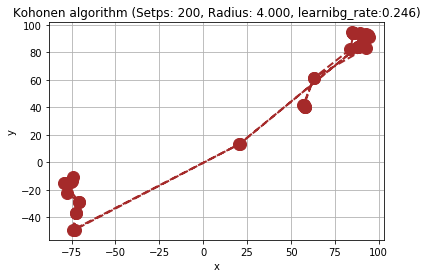

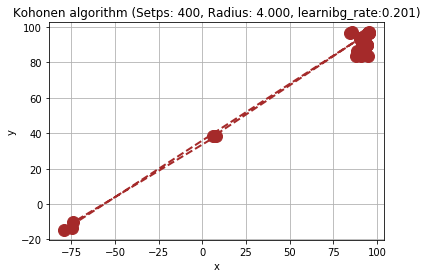

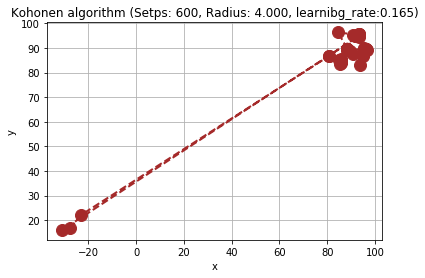

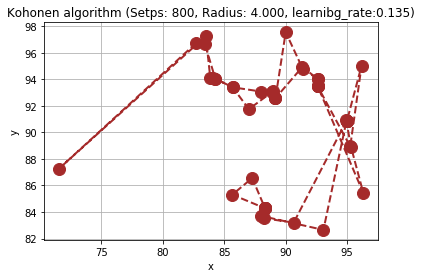

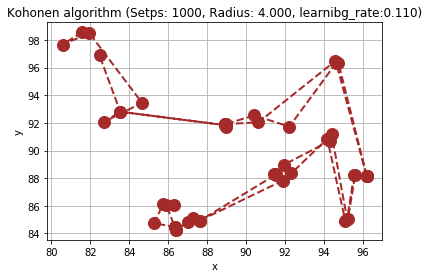

In [0]:
print("model 5") 
x = np.random.uniform(-100,100,50)
y = np.random.uniform(-100,100,50)
step_max =1000
radius = 5
alpha = 0.3
#draw(x, y, 0, radius, alpha)
train2(x, y, step_max, alpha,  radius) 

we see that lowering to learning rate afect the prosses

now:
same experiments as above for fitting a circle of neurons on a torus (i.e a donut shape.)

In [0]:
def Create_circle_points(From_range,to_range,size=100):
    angle=np.random.uniform(0,2*np.pi,size) # 360 -> 2*np.pi
    radius=np.random.uniform(From_range,to_range,size)
    x = radius*np.cos(angle)    # or sin
    y = radius*np.sin(angle)    #    cos
    return x,y


In [0]:
def from_circle():
  x, y = Create_circle_points(-50,50)
  rand=random.randint(0,99)
  return x[rand] ,y[rand]

model 6
circle of data points


1.   number of neruns = 50
2.  dimater =-100 <= x,y <= 100
3.  epoch =1000
4.  learning rate =0.3

model 6


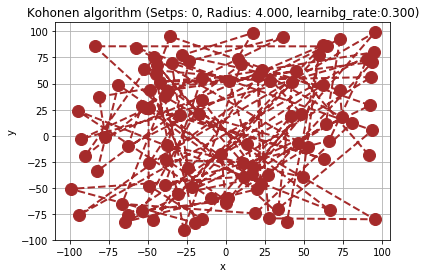

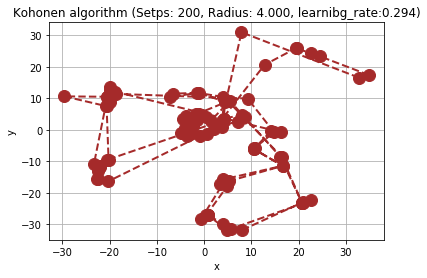

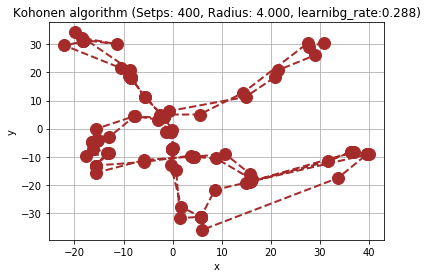

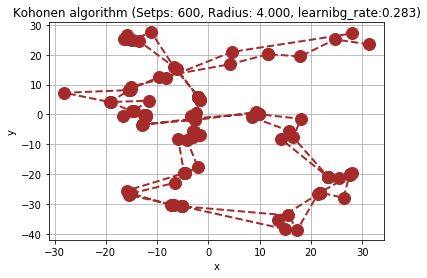

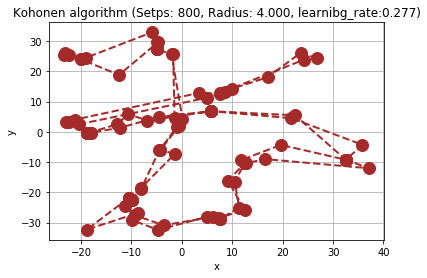

...

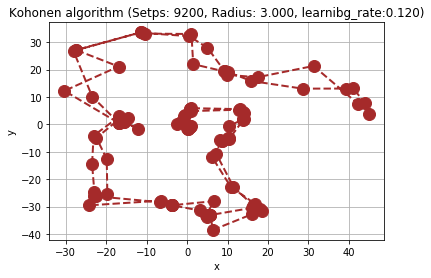

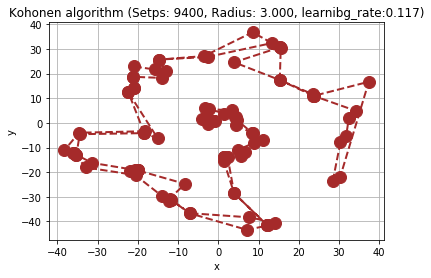

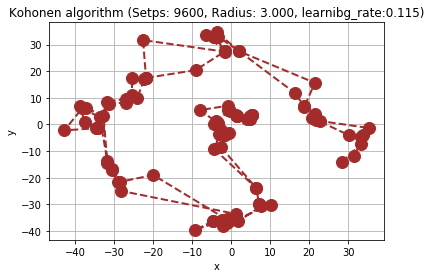

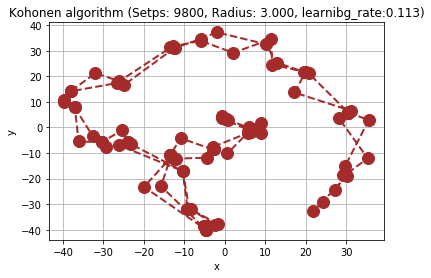

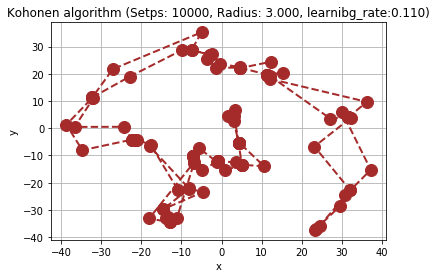

In [0]:
print("model 6")  

x = np.random.uniform(-100,100,100)
y = np.random.uniform(-100,100,100)

step_max =10000
radius = 5
alpha = 0.3

#draw(x, y, 0, radius, alpha)
train2(x, y, step_max, alpha,  radius ,isline=False)

In model 6 we mange to mass all the dots in circle (in radios 50)
It wasnt part of the assiment but its helped us understand how to do model 7.

model 7 circle of data points

number of nerouns = 50

dimater =-100 <= x,y <= 100

epoch =1000

learning rate =0.3

In [0]:
def train3(x,y,steps,alpha,radius,isline=True ,From_range=-100 ,to_range=100):
    init_alpha=alpha
    init_radius=radius
    a=[] 
    b=[]
    if isline:
        for i in range(steps):
            x_rand , y_rand = non_uniform (i ,steps)
            a.append(x_rand) 
            b.append(y_rand)

            ind_min=bmu1(x,y,x_rand,y_rand)

            x,y=update_neightbord1(x,y,ind_min,x_rand,y_rand,init_alpha,init_radius)

            alpha = init_alpha * np.exp(-i/steps)
          #radius  = init_radius * np.exp(-i/steps)
            if i%5000==0 :
                init_radius  = init_radius -1
                radius  = init_radius 
            if i%200==0:
                draw1(x, y, i, radius, alpha,a,b)
            if i == steps-1:
                draw1(x, y, steps, radius, alpha,a,b)
    else:
      
       for i in range(steps):
            x_rand , y_rand = from_circle2()
            
            a.append(x_rand) 
            b.append(y_rand)

            ind_min=bmu1(x,y,x_rand,y_rand)

            x,y=update_neightbord1(x,y,ind_min,x_rand,y_rand,init_alpha,init_radius)

            alpha = init_alpha * np.exp(-i/steps)
          #radius  = init_radius * np.exp(-i/steps)
            if i%5000==0 :
                init_radius  = init_radius -1
                radius  = init_radius 
            if i%200==0:
                draw3(x, y, i, radius, alpha,a,b,isline)
            if i == steps-1:
                draw3(x, y, steps, radius, alpha,a,b,isline)

In [0]:
def draw3(w1, w2, iterate, radius, l_rate, x,y,isline=True):
    fig, ax = plt.subplots()

    #w1, w2 = zip(*sorted(zip(w1,w2)))
    if isline:
      plt.plot(w1, w2, color='brown', marker='o', linestyle='dashed', 
                           linewidth=2, markersize=12)
      
    else:
      plt.plot(w1, w2, color='brown', marker='o', linestyle='dashed', 
                          linewidth=2, markersize=12)
      #plt.plot(x,y, color='blue', marker='o', linestyle='none', 
       #                  markersize=12)
    ax.set(xlabel='x', 
           ylabel='y',
           title='Kohonen algorithm (Setps: {}, Radius: {:.3f}, learnibg_rate:{:.3f})'
           .format(iterate, radius, l_rate))
    ax.grid()
    plt.show()   

In [0]:
def Create_circle_points2(From_range,to_range,size=200):
    angle=np.random.uniform(0,2*np.pi,size) # 360 -> 2*np.pi
    a=[]
    b=[]
    i = size
    while i >0 :
      radius = np.random.uniform(From_range,to_range,1)
      if radius< -30 or radius > 30:
          x = radius*np.sin(angle)    # or sin
          y = radius*np.cos(angle)    #    cos
          a.append(x) 
          b.append(y)
          i=i-1

    return x,y

In [0]:
def from_circle2():
  x, y = Create_circle_points2(-50,50)
  rand=random.randint(0,99)
  return x[rand] ,y[rand]




model 7
donuts shape 


model 7


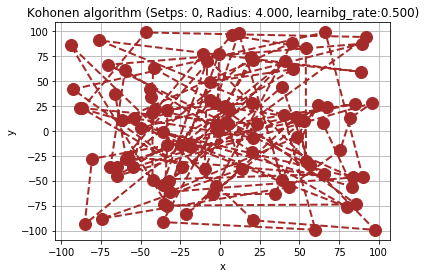

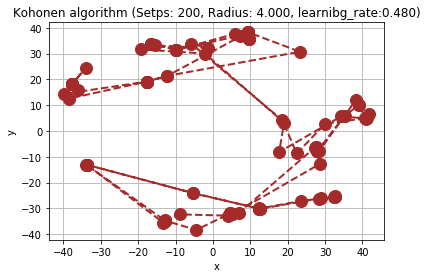

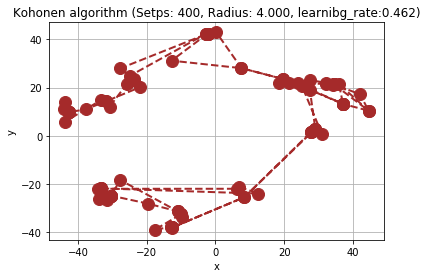

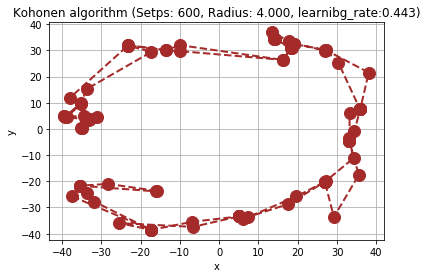

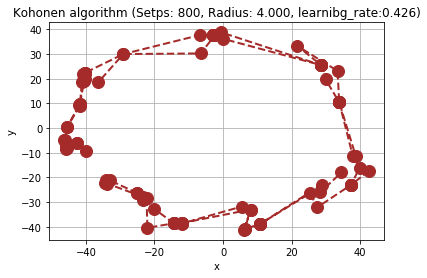

...

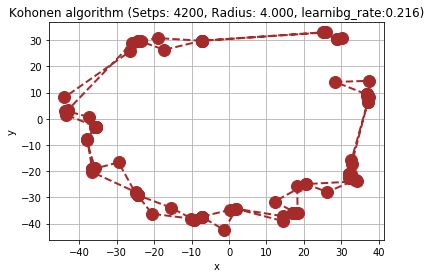

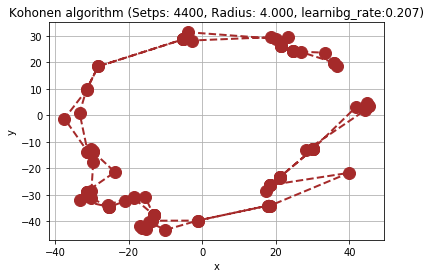

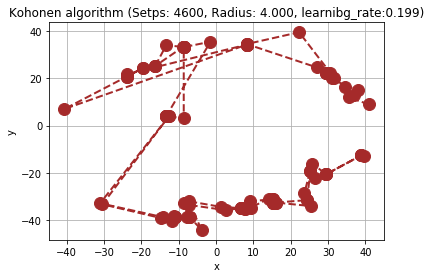

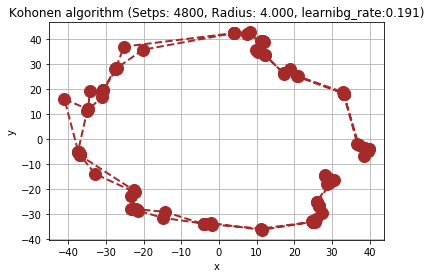

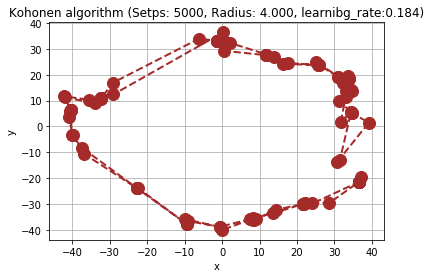

In [0]:
print("model 7")  

x = np.random.uniform(-100,100,100)
y = np.random.uniform(-100,100,100)

step_max =5000
radius = 5
alpha = 0.5

#draw(x, y, 0, radius, alpha)
train3(x, y, step_max, alpha,  radius ,isline=False)